In [2]:
#importiamo le librerie di base
import numpy as np 
import pandas as pd 
import librosa.display  # questa sereve per la rappresentazione grafica e gestione di file audio
import matplotlib.pyplot as plt  # serve per calcoli matematic 

pd.set_option('display.max_columns', None)  #per stampare tutte le colonne
music_data = pd.read_csv('Data/features_30_sec.csv') 
music_data.head(5) #per vedere le prime 5 righe del dataset



,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,9.015054e+05,0.083045,0.000767,-4.529724e-05,0.008172,0.000008,0.005698,123.046875,-113.570648,2564.207520,121.571793,295.913818,-19.168142,235.574432,42.366421,151.106873,-6.364664,167.934799,18.623499,89.180840,-13.704891,67.660492,15.343150,68.932579,-12.274110,82.204201,10.976572,63.386311,-8.326573,61.773094,8.803792,51.244125,-3.672300,41.217415,5.747995,40.554478,-5.162882,49.775421,0.752740,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,2.977893e+06,0.056040,0.001448,1.395807e-04,0.005099,-0.000178,0.003063,67.999589,-207.501694,7764.555176,123.991264,560.259949,8.955127,572.810913,35.877647,264.506104,2.907320,279.932922,21.510466,156.477097,-8.560436,200.849182,23.370686,142.555954,-10.099661,166.108521,11.900497,104.358612,-5.555639,105.173630,5.376327,96.197212,-2.231760,64.914291,4.220140,73.152534,-6.012148,52.422142,0.927998,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,7.840345e+05,0.076291,0.001007,2.105576e-06,0.016342,-0.000019,0.007458,161.499023,-90.722595,3319.044922,140.446304,508.765045,-29.093889,411.781219,31.684334,144.090317,-13.984504,155.493759,25.764742,74.548401,-13.664875,106.981827,11.639934,106.574875,-11.783643,65.447945,9.718760,67.908859,-13.133803,57.781425,5.791199,64.480209,-8.907628,60.385151,-1.077000,57.711136,-9.229274,36.580986,2.451690,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,1.493194e+06,0.033309,0.000423,4.583644e-07,0.019054,-0.000014,0.002712,63.024009,-199.544205,5507.517090,150.090897,456.505402,5.662678,257.161163,26.859079,158.267303,1.771399,268.034393,14.234031,126.794128,-4.832006,155.912079,9.286494,81.273743,-0.759186,92.114090,8.137607,71.314079,-3.200653,110.236687,6.079319,48.251999,-2.480174,56.799400,-1.079305,62.289902,-2.870789,51.651592,0.780874,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,1.572978e+06,0.101461,0.001954,-1.756129e-05,0.004814,-0.000010,0.003094,135.999178,-160.337708,5195.291992,126.219635,853.784729,-35.587811,333.792938,22.148071,193.456100,-32.478600,336.276825,10.852294,134.831573,-23.352329,93.257095,0.498434,124.672127,-11.793437,130.073349,1.207256,99.675575,-13.088418,80.254066,-2.813867,86.430626,-6.933385,89.555443,-7.552725,70.943336,-9.164666,75.793404,-4.520576,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


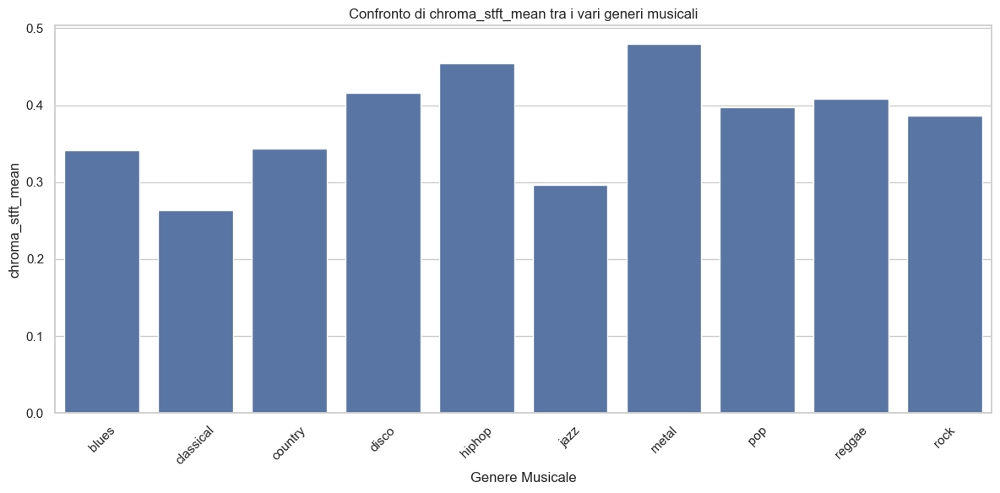

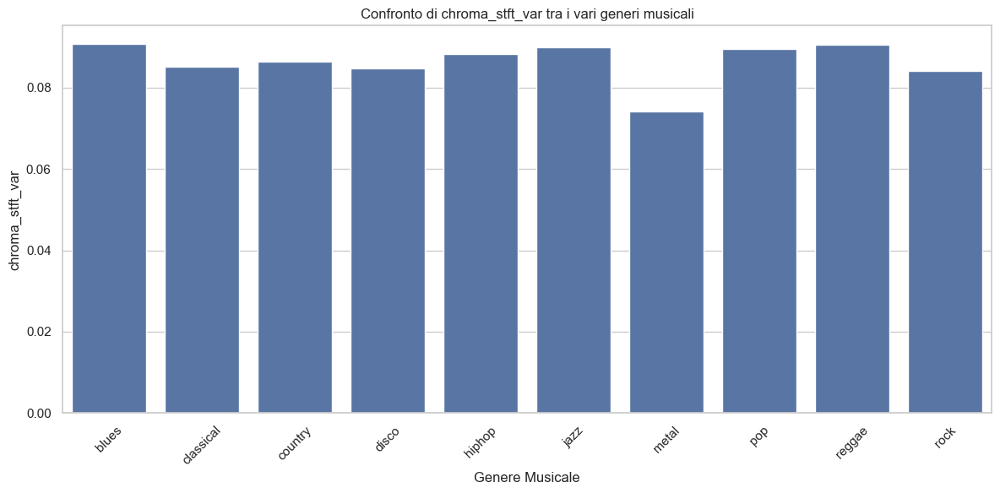

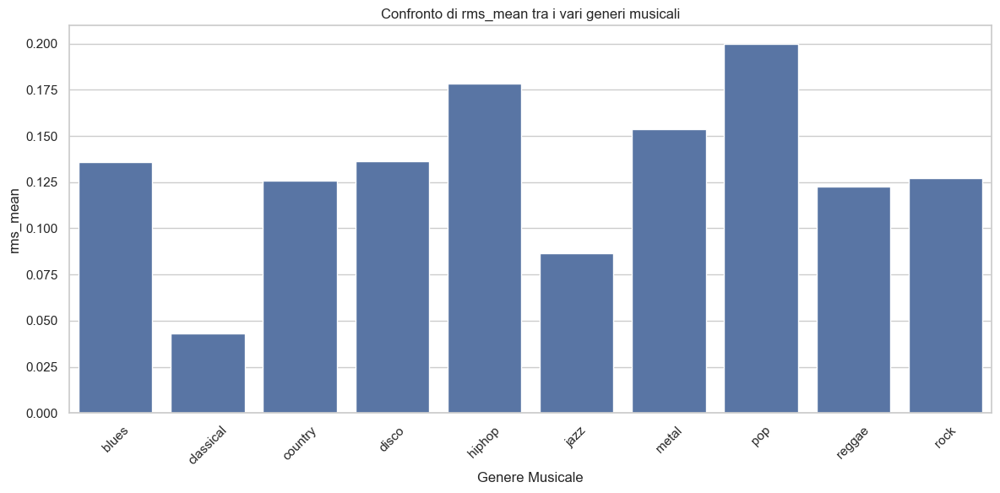

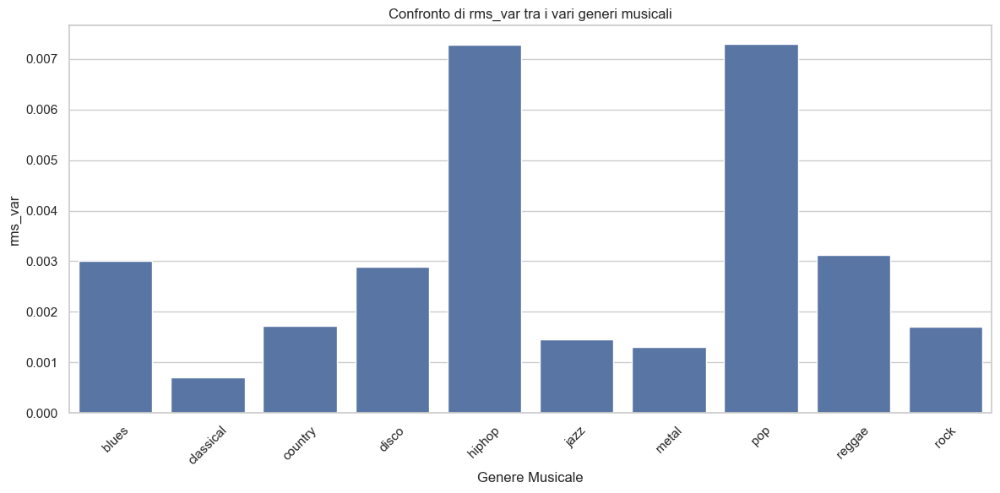

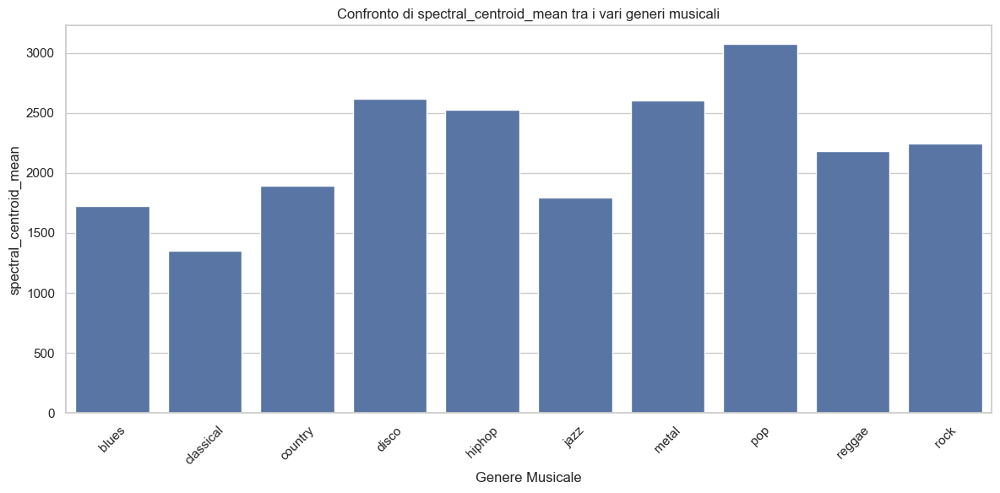

...

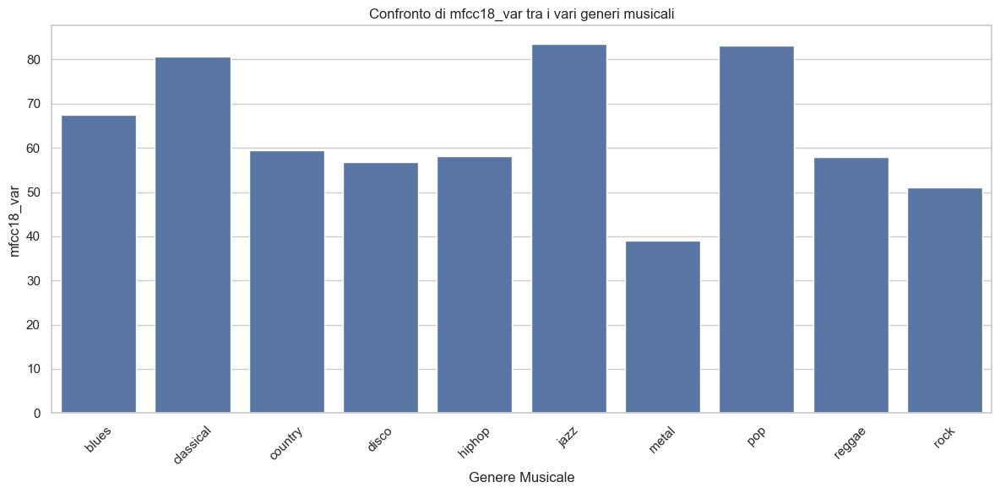

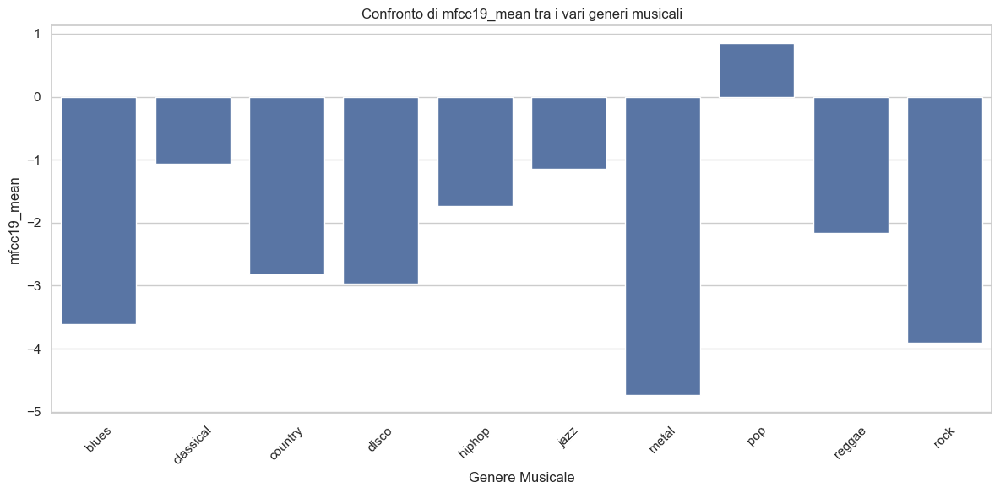

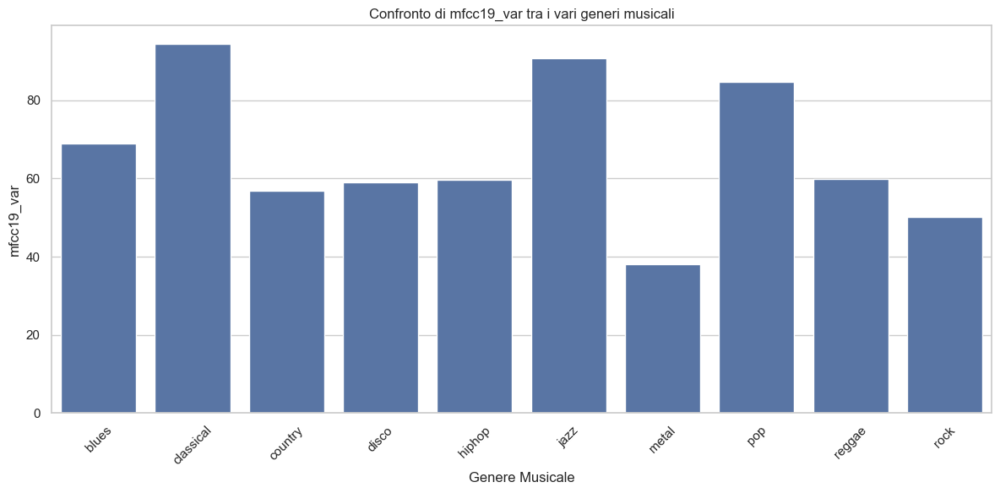

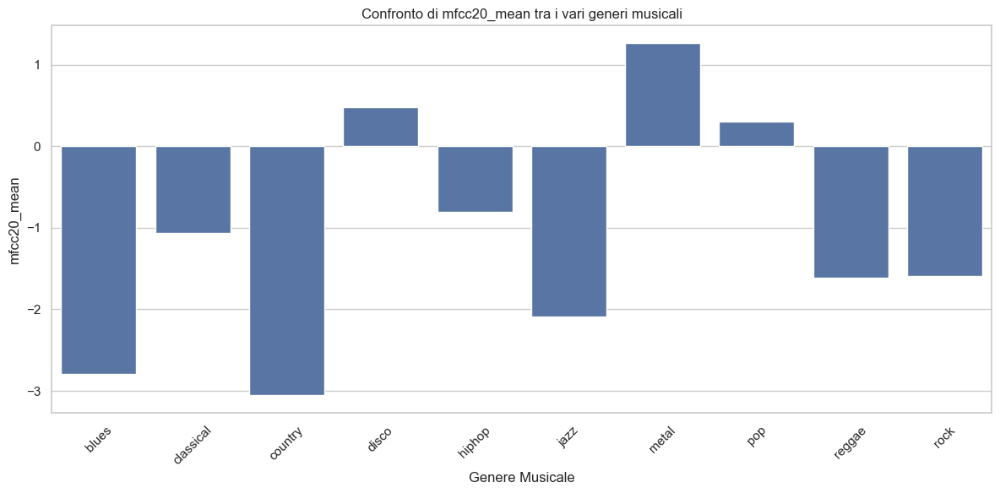

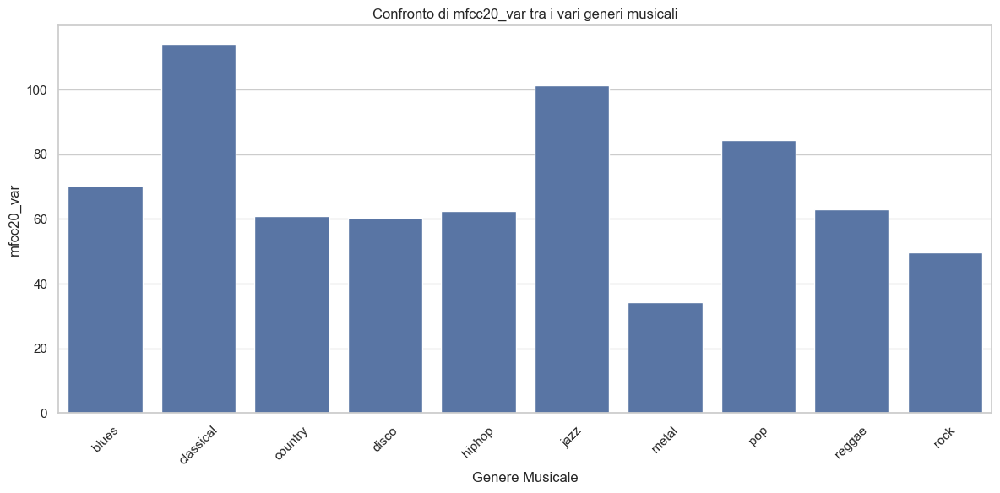

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt

music_data_clean = music_data.drop(columns=['filename'])

# Seleziona solo le colonne numeriche
numeric_columns = music_data_clean.select_dtypes(include=[np.number])

# Calcola la media delle features per ogni genere musicale
mean_values = music_data_clean.groupby('label').mean().reset_index()

# Imposta il tema di Seaborn
sns.set_theme(style="whitegrid")

# Crea un grafico a barre per ogni feature
for feature in mean_values.columns[2:]:  # Escludi la prima colonna 'label'
    plt.figure(figsize=(12, 6))
    sns.barplot(x='label', y=feature, data=mean_values)
    plt.title(f'Confronto di {feature} tra i vari generi musicali')
    plt.xlabel('Genere Musicale')
    plt.ylabel(feature)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [37]:
# Seleziona solo le colonne numeriche
numeric_columns = music_data_clean.select_dtypes(include=[np.number])

# Definisci le features di interesse
features_of_interest = [
    'chroma_stft_mean',
    'rms_mean',
    'spectral_centroid_mean',
    'spectral_bandwidth_mean',
    'rolloff_mean',
    'zero_crossing_rate_mean',
    'harmony_mean',
    'tempo',
    'mfcc1_mean',
    'mfcc2_mean',
    'mfcc3_mean',
]

# Raggruppa i dati per 'label' e calcola le statistiche descrittive
agg_stats = music_data_clean.groupby('label')[features_of_interest].agg(['mean', 'median', 'var', 'std'])


agg_stats.columns = ['_'.join(col).strip() for col in agg_stats.columns.values]
# Stampa i risultati
print(agg_stats)

           chroma_stft_mean_mean  chroma_stft_mean_median  \
label                                                       
blues                   0.341429                 0.339091   
classical               0.263542                 0.260931   
country                 0.343812                 0.347686   
disco                   0.415643                 0.416673   
hiphop                  0.454319                 0.452387   
jazz                    0.296643                 0.285688   
metal                   0.479235                 0.477866   
pop                     0.397632                 0.402106   
reggae                  0.408247                 0.396217   
rock                    0.386315                 0.390181   

           chroma_stft_mean_var  chroma_stft_mean_std  rms_mean_mean  \
label                                                                  
blues                  0.003413              0.058422       0.136067   
classical              0.001944              0.0440

In [39]:
numeric_columns = music_data_clean.select_dtypes(include=[np.number])

# Calcola la matrice di correlazione
correlation_matrix = numeric_columns.corr()
print(correlation_matrix)

                           length  chroma_stft_mean  chroma_stft_var  \
length                   1.000000          0.017426         0.073979   
chroma_stft_mean         0.017426          1.000000        -0.461729   
chroma_stft_var          0.073979         -0.461729         1.000000   
rms_mean                 0.101801          0.499926        -0.078777   
rms_var                  0.116661          0.261544         0.290138   
spectral_centroid_mean   0.052175          0.615728        -0.246441   
spectral_centroid_var    0.121994          0.285926         0.305819   
spectral_bandwidth_mean  0.062503          0.517710        -0.036896   
spectral_bandwidth_var   0.118993          0.041088         0.346907   
rolloff_mean             0.040363          0.598122        -0.168721   
rolloff_var              0.106346          0.117139         0.383134   
zero_crossing_rate_mean  0.025562          0.554771        -0.470186   
zero_crossing_rate_var   0.113593          0.355920         0.16

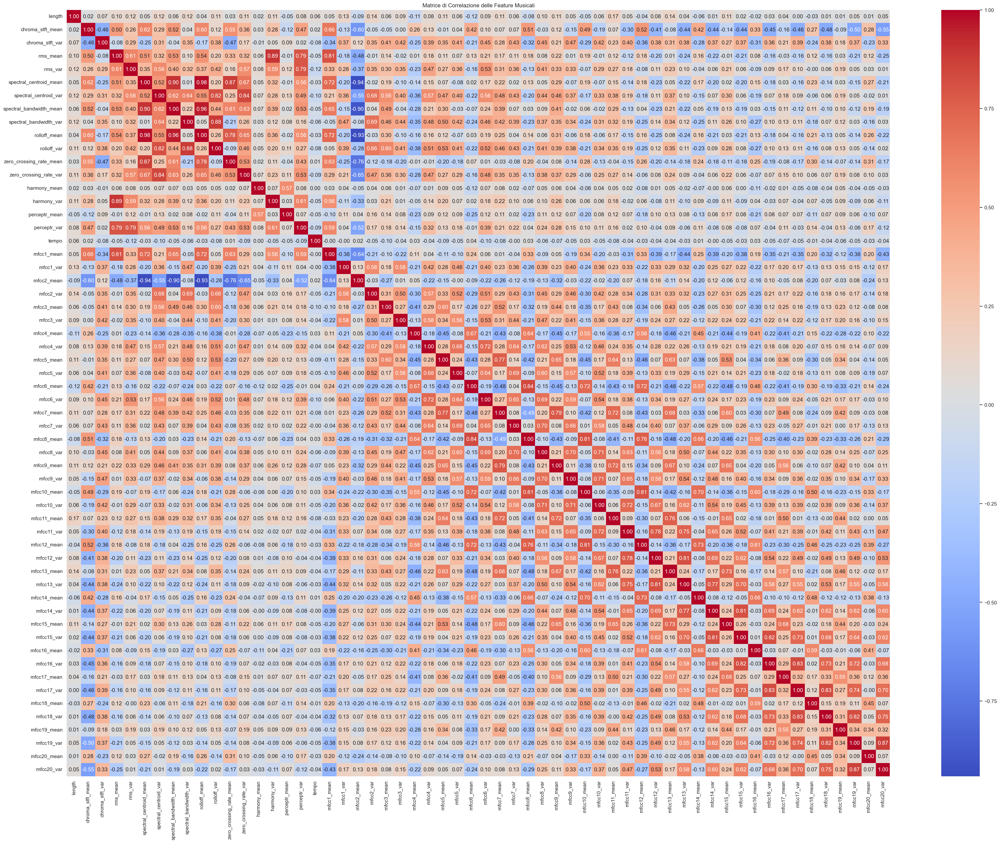

In [45]:
plt.figure(figsize=(40, 30))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Matrice di Correlazione delle Feature Musicali')
plt.show()

<Figure size 2000x2000 with 0 Axes>

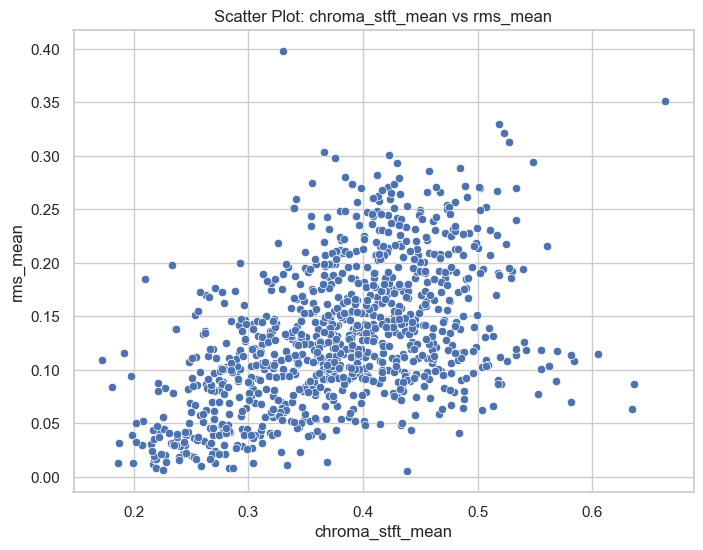

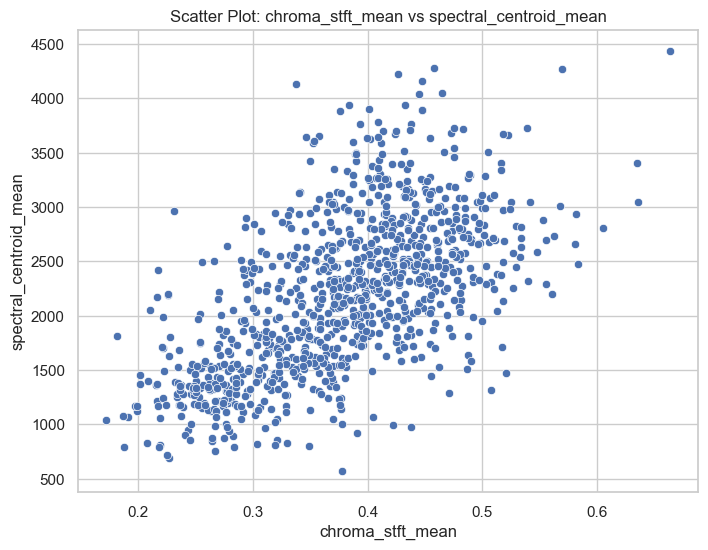

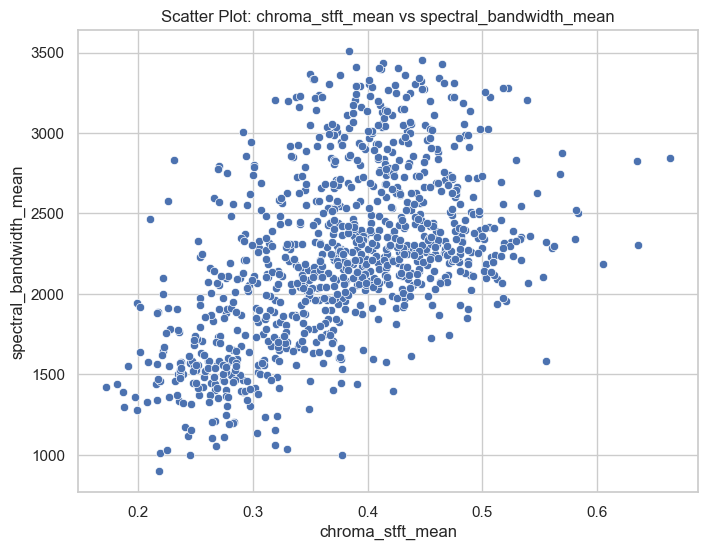

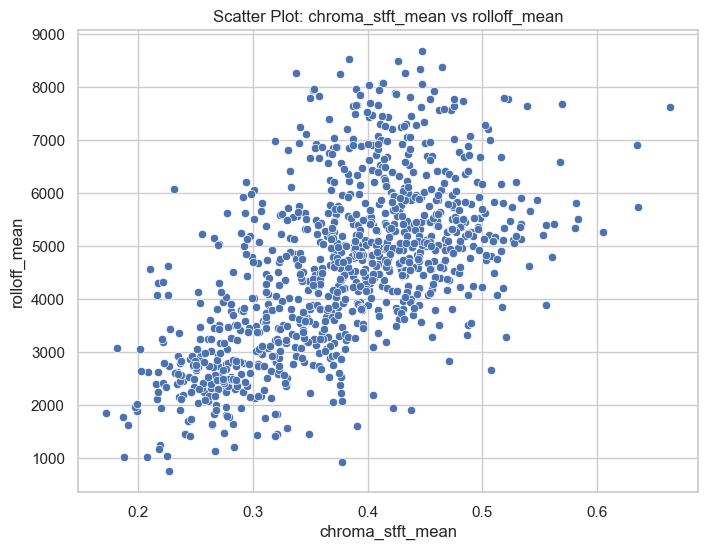

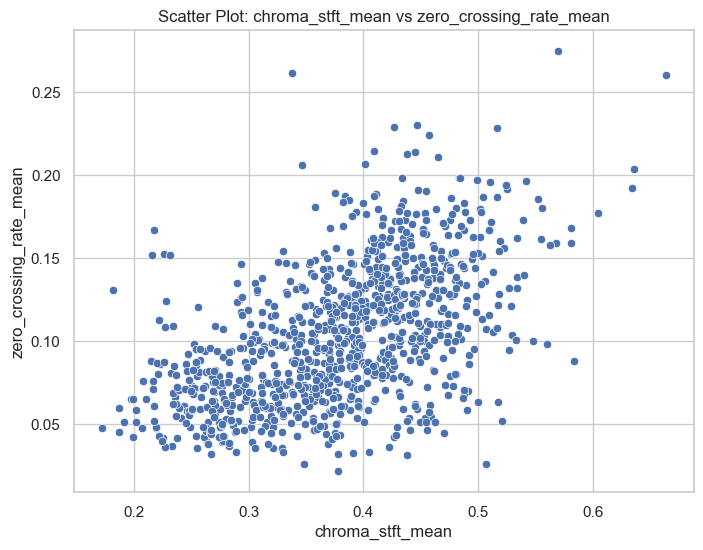

...

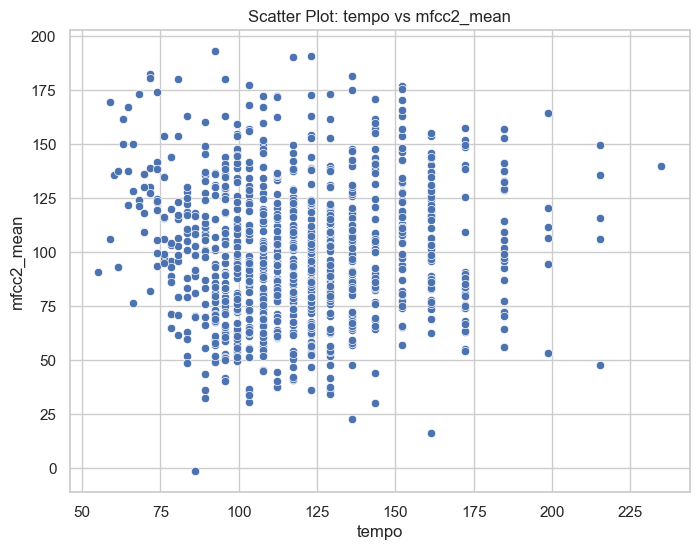

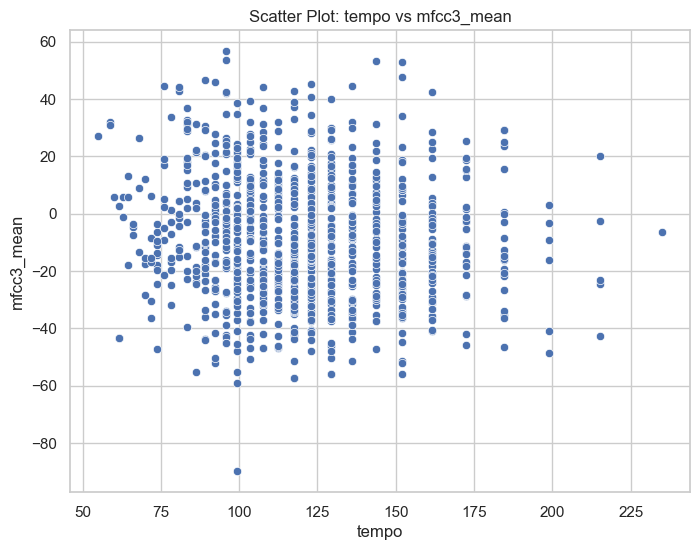

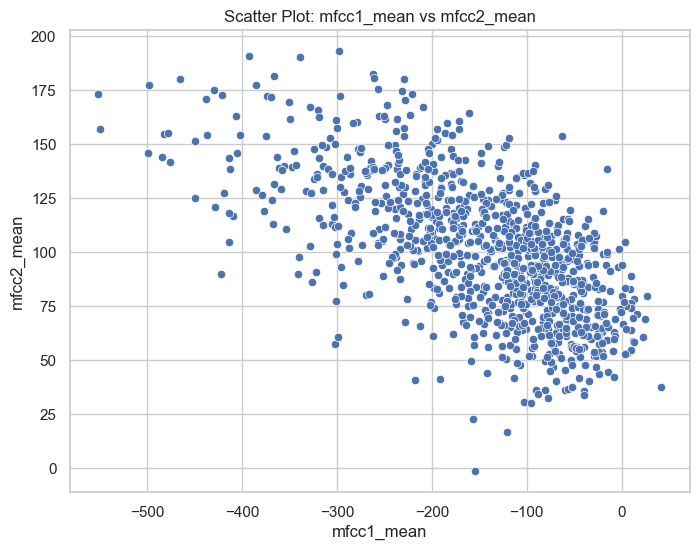

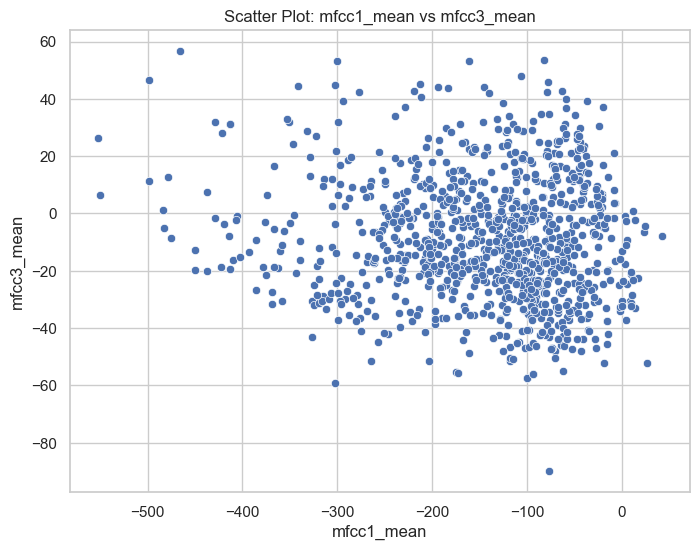

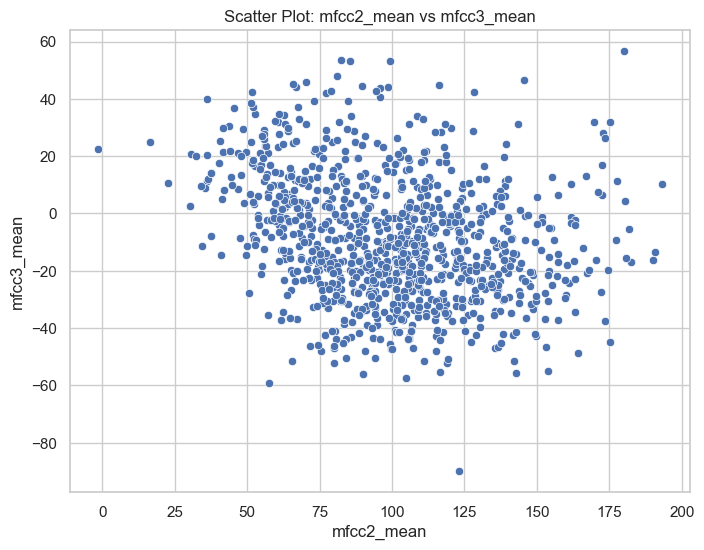

In [52]:
features = [
    'chroma_stft_mean',
    'rms_mean',
    'spectral_centroid_mean',
    'spectral_bandwidth_mean',
    'rolloff_mean',
    'zero_crossing_rate_mean',
    'harmony_mean',
    'tempo',
    'mfcc1_mean',
    'mfcc2_mean',
    'mfcc3_mean',
]

# Crea una matrice di grafici a dispersione per le feature selezionate
num_features = len(features)

# Imposta la dimensione del grafico
plt.figure(figsize=(20, 20))

# Crea un grafico a dispersione per ogni coppia di feature
for i in range(len(features)):
    for j in range(i + 1, len(features)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(data=music_data_clean, x=features[i], y=features[j])
        plt.title(f'Scatter Plot: {features[i]} vs {features[j]}')
        plt.xlabel(features[i])
        plt.ylabel(features[j])
        plt.grid(True)
        plt.show()

<h1 PCA>

<H1 PCA>

Varianza spiegata da ciascuna componente:
[0.23568344 0.1665449  0.10565515 0.07470894 0.04501412 0.0337771
 0.02943903 0.02561621 0.02373193 0.01963377 0.01772879 0.01601975
 0.01578185 0.0129119  0.01244251 0.01108929 0.00953749 0.00854054
 0.00793915 0.00727253]

Somma delle varianze spiegate dalle 15 componenti: 0.8791


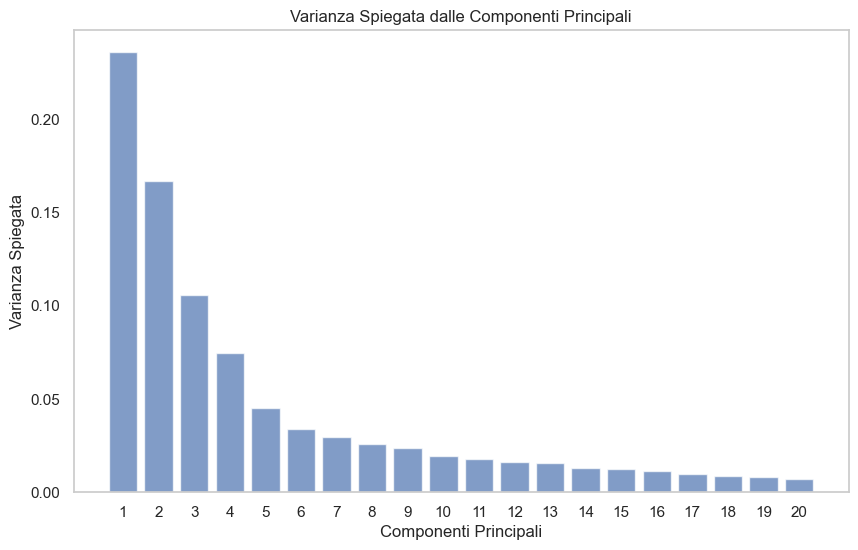

In [67]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt



# 2. Rimuovi la colonna non numerica 'filename' e altre colonne non necessarie
music_data_clean = music_data.drop(columns=['filename', 'label'])  # Rimuovi anche 'label' per la PCA

# 3. Standardizza i dati
scaler = StandardScaler()
music_data_scaled = scaler.fit_transform(music_data_clean)

# 4. Esegui la PCA con 15 componenti principali
pca = PCA(n_components=20)
principal_components = pca.fit_transform(music_data_scaled)

# Crea un DataFrame per le componenti principali
pca_df = pd.DataFrame(data=principal_components, columns=[f'PC{i+1}' for i in range(20)])

# 5. Stampa la varianza spiegata da ciascuna componente
explained_variance = pca.explained_variance_ratio_
print("Varianza spiegata da ciascuna componente:")
print(explained_variance)

# 6. Calcola e stampa la somma delle varianze spiegate
total_variance = explained_variance.sum()
print(f"\nSomma delle varianze spiegate dalle 15 componenti: {total_variance:.4f}")

# 7. Visualizza la varianza spiegata da ciascuna componente
plt.figure(figsize=(10, 6))
plt.bar(range(1, 21), explained_variance, alpha=0.7, color='b', align='center')
plt.ylabel('Varianza Spiegata')
plt.xlabel('Componenti Principali')
plt.title('Varianza Spiegata dalle Componenti Principali')
plt.xticks(range(1, 21))
plt.grid()
plt.show()


In [69]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# 1. Carica il tuo dataset
music_data = pd.read_csv('Data/features_30_sec.csv')

# 2. Rimuovi la colonna non numerica 'filename'
music_data_clean = music_data.drop(columns=['filename'])

# 3. Separare le features e le etichette
X = music_data_clean.drop(columns=['label'])  # Features
y = music_data_clean['label']  # Etichette

# 4. Standardizza i dati
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 5. Esegui la PCA e riduci a 15 componenti principali
pca = PCA(n_components=20)
X_pca = pca.fit_transform(X_scaled)

# 6. Dividi il dataset in set di addestramento e di test
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

# 7. Crea e addestra il modello Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# 8. Fai previsioni sul set di test
y_pred = rf_model.predict(X_test)

# 9. Valuta il modello
print("Matrice di confusione:")
print(confusion_matrix(y_test, y_pred))
print("\nReport di classificazione:")
print(classification_report(y_test, y_pred))


Matrice di confusione:
[[ 9  1  0  0  2  0  3  0  0  5]
 [ 0 12  0  0  0  1  0  0  0  0]
 [ 3  0 18  1  0  0  1  0  2  2]
 [ 1  0  1  8  4  0  1  3  1  2]
 [ 0  0  0  0 12  0  0  0  3  0]
 [ 2  0  2  1  0 17  0  0  0  0]
 [ 0  0  0  1  2  0 21  0  0  1]
 [ 0  0  1  0  0  1  0  9  2  0]
 [ 1  0  3  4  3  0  1  1  9  1]
 [ 2  0  3  3  0  0  2  0  1 10]]

Report di classificazione:
              precision    recall  f1-score   support

       blues       0.50      0.45      0.47        20
   classical       0.92      0.92      0.92        13
     country       0.64      0.67      0.65        27
       disco       0.44      0.38      0.41        21
      hiphop       0.52      0.80      0.63        15
        jazz       0.89      0.77      0.83        22
       metal       0.72      0.84      0.78        25
         pop       0.69      0.69      0.69        13
      reggae       0.50      0.39      0.44        23
        rock       0.48      0.48      0.48        21

    accuracy          

In [9]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)  # Codifica i generi musicali in numeri

# 2. Suddividi il dataset in set di addestramento e di test
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# 3. Standardizza i dati (scaling)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Inizializza la regressione logistica con penalizzazione L1 (simile al Lasso)
log_reg_l1 = LogisticRegression(penalty='l1', solver='liblinear', max_iter=1000)

# 5. Addestra il modello
log_reg_l1.fit(X_train_scaled, y_train)

# 6. Fai previsioni
y_pred = log_reg_l1.predict(X_test_scaled)

# 7. Valuta la performance con l'accuratezza
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# 8. Mostra le feature importanti
coefficients = pd.Series(log_reg_l1.coef_[0], index=X.columns)
print("Coefficienti della Logistic Regression con penalizzazione L1:\n", coefficients)

# 9. Visualizza le feature selezionate
print("Feature selezionate (con coefficienti diversi da zero):")
print(coefficients[coefficients != 0])


Accuracy: 0.72
Coefficienti della Logistic Regression con penalizzazione L1:
 length                     0.000000
chroma_stft_mean          -1.319837
chroma_stft_var            1.230555
rms_mean                   1.180018
rms_var                    0.784606
spectral_centroid_mean    -2.826043
spectral_centroid_var     -3.405512
spectral_bandwidth_mean    0.000000
spectral_bandwidth_var    -0.580349
rolloff_mean               0.000000
rolloff_var                0.000000
zero_crossing_rate_mean    2.276038
zero_crossing_rate_var     0.000000
harmony_mean               0.160841
harmony_var                0.000000
perceptr_mean             -0.174899
perceptr_var              -0.188245
tempo                     -0.109691
mfcc1_mean                 0.622428
mfcc1_var                  0.373408
mfcc2_mean                -0.249703
mfcc2_var                  0.569906
mfcc3_mean                 1.747508
mfcc3_var                  0.148859
mfcc4_mean                 0.725037
mfcc4_var             

In [36]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PowerTransformer  # Importa PowerTransformer
from sklearn.preprocessing import QuantileTransformer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, fbeta_score, hinge_loss


# Caricare i dati dal CSV
file_path = 'Data/features_30_sec.csv'
data_30 = pd.read_csv(file_path)


data_30['rms_var_to_mean'] = data_30['rms_var'] / data_30['rms_mean']
data_30['chroma_stft_var_to_mean'] = data_30['chroma_stft_var'] / data_30['chroma_stft_mean']
data_30['rolloff_to_centroid'] = data_30['rolloff_mean'] / data_30['spectral_centroid_mean']
data_30['spectral_bandwidth_to_centroid'] = data_30['spectral_bandwidth_mean'] / data_30['spectral_centroid_mean']
data_30['mfcc_mean_sum'] = data_30[[f'mfcc{i}_mean' for i in range(1, 21)]].sum(axis=1)
data_30['mfcc_var_sum'] = data_30[[f'mfcc{i}_var' for i in range(1, 21)]].sum(axis=1)
data_30['tempo_normalized'] = data_30['tempo'] / data_30['length']
data_30['zero_cross_rolloff_ratio'] = data_30['zero_crossing_rate_mean'] / data_30['rolloff_mean']
siz= data_30.columns.size
print(f'La dimensione: {siz}')



La dimensione: 68


In [59]:
# Caricare i dati dal CSV


# Stampa i nomi delle colonne per verificare
#print("Colonne nel DataFrame:", data_30.columns)

# Separare le caratteristiche e le etichette
X = data_30.drop(columns=['filename', 'label'])  # Rimuovi filename e label
y = data_30['label']  # Etichette

# Suddividere il dataset in set di addestramento e test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardizzare le caratteristiche
robust = RobustScaler()
standard = StandardScaler()
minmax = MinMaxScaler()
power = PowerTransformer()
scalers=[robust, standard, minmax, power]

print('FINITO')
siz= music_data.columns.size
print(f'La dimensione: {siz}')


for scaler in scalers:
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Creare il modello SVM
    model = SVC(C=10, gamma='scale', kernel='rbf')
    model.fit(X_train, y_train)

    # Prevedere le etichette per il set di test
    y_pred = model.predict(X_test)

    # Calcolare l'accuratezza
    # Calcolare metriche
    accuracy_mod = accuracy_score(y_test, y_pred)
    precision_mod = precision_score(y_test, y_pred, average='macro')  # Macro per bilanciare le classi
    recall_mod = recall_score(y_test, y_pred, average='macro')
    f1_mod = f1_score(y_test, y_pred, average='macro')
    f2_mod = fbeta_score(y_test, y_pred, beta=2, average='macro')  # F2-score con beta=2

    # Stampare i risultati
    print(f'           Scaler: {scaler}')
    print(f'Accuratezza: {accuracy_mod:.4f}')
    print(f'Precision: {precision_mod:.4f}')
    print(f'Recall: {recall_mod:.4f}')
    print(f'F1-score: {f1_mod:.4f}')
    print(f'F2-score: {f2_mod:.4f}')
   # print(f'Hinge Loss: {loss}')
    print('------------------------------------------------------------')

FINITO
La dimensione: 68
           Scaler: RobustScaler()
Accuratezza: 0.7200
Precision: 0.7230
Recall: 0.7325
F1-score: 0.7220
F2-score: 0.7270
------------------------------------------------------------
           Scaler: StandardScaler()
Accuratezza: 0.7400
Precision: 0.7343
Recall: 0.7464
F1-score: 0.7344
F2-score: 0.7401
------------------------------------------------------------
           Scaler: MinMaxScaler()
Accuratezza: 0.7650
Precision: 0.7704
Recall: 0.7766
F1-score: 0.7642
F2-score: 0.7695
------------------------------------------------------------
           Scaler: PowerTransformer()
Accuratezza: 0.7900
Precision: 0.7945
Recall: 0.8007
F1-score: 0.7882
F2-score: 0.7934
------------------------------------------------------------


In [43]:
file_path = 'Data/features_30_sec.csv'
data_original = pd.read_csv(file_path)
X = data_original.drop(columns=['filename', 'label'])  # Rimuovi filename e label
y = data_original['label']  # Etichette

# Suddividere il dataset in set di addestramento e test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardizzare le caratteristiche
robust = RobustScaler()
standard = StandardScaler()

minmax = MinMaxScaler()
power = PowerTransformer()
scalers=[robust, standard, minmax, power]

print('FINITO')
siz= data_original.columns.size
print(f'La dimensione: {siz}')


for scaler in scalers:
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Creare il modello SVM
    model = SVC(C=10, gamma='scale', kernel='rbf')
    model.fit(X_train, y_train)

    # Prevedere le etichette per il set di test
    y_pred = model.predict(X_test)

    # Calcolare l'accuratezza
    # Calcolare metriche
    accuracy_original = accuracy_score(y_test, y_pred)
    precision_original = precision_score(y_test, y_pred, average='macro')  # Macro per bilanciare le classi
    recall_original = recall_score(y_test, y_pred, average='macro')
    f1_original= f1_score(y_test, y_pred, average='macro')
    f2_original = fbeta_score(y_test, y_pred, beta=2, average='macro')  # F2-score con beta=2

    # Stampare i risultati
    print(f'           Scaler: {scaler}')
    print(f'Accuratezza: {accuracy_original:.4f}')
    print(f'Precision: {precision_original:.4f}')
    print(f'Recall: {recall_original:.4f}')
    print(f'F1-score: {f1_original:.4f}')
    print(f'F2-score: {f2_original:.4f}')
   # print(f'Hinge Loss: {loss}')
    print('------------------------------------------------------------')

FINITO
La dimensione: 60
           Scaler: RobustScaler()
Accuratezza: 0.7200
Precision: 0.7230
Recall: 0.7325
F1-score: 0.7220
F2-score: 0.7270
------------------------------------------------------------
           Scaler: StandardScaler()
Accuratezza: 0.7400
Precision: 0.7343
Recall: 0.7464
F1-score: 0.7344
F2-score: 0.7401
------------------------------------------------------------
           Scaler: MinMaxScaler()
Accuratezza: 0.7650
Precision: 0.7704
Recall: 0.7766
F1-score: 0.7642
F2-score: 0.7695
------------------------------------------------------------
           Scaler: PowerTransformer()
Accuratezza: 0.7900
Precision: 0.7945
Recall: 0.8007
F1-score: 0.7882
F2-score: 0.7934
------------------------------------------------------------


In [52]:
# Stampare i risultati
print('DATI ORIGINALI')
print(f'           Scaler: {scaler}')
print(f'Accuratezza: {accuracy_original:.4f}')
print(f'Precision: {precision_original:.4f}')
print(f'Recall: {recall_original:.4f}')
print(f'F1-score: {f1_original:.4f}')
print(f'F2-score: {f2_original:.4f}')
   # print(f'Hinge Loss: {loss}')
print('------------------------------------------------------------')


    # Stampare i risultati
print('DATI MODIFICATI')
print(f'           Scaler: {scaler}')
print(f'Accuratezza: {accuracy_mod:.4f}')
print(f'Precision: {precision_mod:.4f}')
print(f'Recall: {recall_mod:.4f}')
print(f'F1-score: {f1_mod:.4f}')
print(f'F2-score: {f2_mod:.4f}')
   # print(f'Hinge Loss: {loss}')
print('------------------------------------------------------------')



DATI ORIGINALI
           Scaler: PowerTransformer()
Accuratezza: 0.7900
Precision: 0.7945
Recall: 0.8007
F1-score: 0.7882
F2-score: 0.7934
------------------------------------------------------------
DATI MODIFICATI
           Scaler: PowerTransformer()
Accuratezza: 0.7900
Precision: 0.7945
Recall: 0.8007
F1-score: 0.7882
F2-score: 0.7934
------------------------------------------------------------


In [60]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Carica i dati dal CSV
data_30 = pd.read_csv(file_path)

# Assicurati di non includere colonne non numeriche nel set di feature
# Supponiamo che la colonna 'label' sia quella target e 'filename' non ti serve
X = data_30.drop(columns=['label', 'filename'])  # Rimuovi 'filename' e 'label'
y = data_30['label']

# Converti le etichette in numerico se necessario
# Se 'label' è una variabile categorica (es. 'blues', 'rock', etc.), convertili
y = y.astype('category').cat.codes  # Converte le etichette in numeri

# Divisione del dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Modello Random Forest
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)

# Importanza delle feature
importances = rf.feature_importances_

# Creare un DataFrame per visualizzare l'importanza delle feature
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Stampa l'importanza delle feature
print(feature_importance_df)

num_righe_importanza = feature_importance_df.shape[0]
print(f'Il numero di righe in feature_importance_df è: {num_righe_importanza}')


                    Feature  Importance
16             perceptr_var    0.041720
1          chroma_stft_mean    0.040789
0                    length    0.039669
3                  rms_mean    0.030980
4                   rms_var    0.030062
24               mfcc4_mean    0.029062
7   spectral_bandwidth_mean    0.028788
6     spectral_centroid_var    0.026518
9              rolloff_mean    0.026512
2           chroma_stft_var    0.025619
27                mfcc5_var    0.023484
18               mfcc1_mean    0.023051
34               mfcc9_mean    0.022901
28               mfcc6_mean    0.022456
14              harmony_var    0.020971
25                mfcc4_var    0.020179
5    spectral_centroid_mean    0.020118
10              rolloff_var    0.018663
40              mfcc12_mean    0.017338
30               mfcc7_mean    0.017001
23                mfcc3_var    0.016650
50              mfcc17_mean    0.016380
32               mfcc8_mean    0.016325
11  zero_crossing_rate_mean    0.016091


In [64]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Passo 1: Carica i dati dal CSV
file_path = 'Data/features_30_sec.csv'  # Assicurati di avere il percorso corretto
data_30 = pd.read_csv(file_path)

# Passo 2: Aggiungi le nuove colonne
data_30['rms_var_to_mean'] = data_30['rms_var'] / data_30['rms_mean']
data_30['chroma_stft_var_to_mean'] = data_30['chroma_stft_var'] / data_30['chroma_stft_mean']
data_30['rolloff_to_centroid'] = data_30['rolloff_mean'] / data_30['spectral_centroid_mean']
data_30['spectral_bandwidth_to_centroid'] = data_30['spectral_bandwidth_mean'] / data_30['spectral_centroid_mean']
data_30['mfcc_mean_sum'] = data_30[[f'mfcc{i}_mean' for i in range(1, 21)]].sum(axis=1)
data_30['mfcc_var_sum'] = data_30[[f'mfcc{i}_var' for i in range(1, 21)]].sum(axis=1)
data_30['tempo_normalized'] = data_30['tempo'] / data_30['length']
data_30['zero_cross_rolloff_ratio'] = data_30['zero_crossing_rate_mean'] / data_30['rolloff_mean']

# Passo 3: Assicurati di non includere colonne non numeriche nel set di feature
X = data_30.drop(columns=['label', 'filename'])  # Rimuovi 'filename' e 'label'
y = data_30['label']

# Converti le etichette in numerico se necessario
y = y.astype('category').cat.codes  # Converte le etichette in numeri

# Passo 4: Divisione del dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Passo 5: Modello Random Forest
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)

importances = rf.feature_importances_

# Creare un DataFrame per visualizzare l'importanza delle feature
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

pd.set_option('display.max_rows', None)

# Stampa l'importanza delle feature
print(feature_importance_df)

num_righe_importanza = feature_importance_df.shape[0]
print(f'Il numero di righe in feature_importance_df è: {num_righe_importanza}')


                           Feature  Importance
16                    perceptr_var    0.044183
1                 chroma_stft_mean    0.037263
0                           length    0.035518
59         chroma_stft_var_to_mean    0.027050
4                          rms_var    0.023856
7          spectral_bandwidth_mean    0.022606
24                      mfcc4_mean    0.022578
3                         rms_mean    0.022397
18                      mfcc1_mean    0.021942
9                     rolloff_mean    0.021476
2                  chroma_stft_var    0.021197
58                 rms_var_to_mean    0.021080
6            spectral_centroid_var    0.020940
28                      mfcc6_mean    0.020741
27                       mfcc5_var    0.020559
34                      mfcc9_mean    0.019488
65        zero_cross_rolloff_ratio    0.019426
62                   mfcc_mean_sum    0.019086
14                     harmony_var    0.018914
10                     rolloff_var    0.017779
31           

In [71]:
file_path = 'Data/features_30_sec.csv'
data_original = pd.read_csv(file_path)
X = data_original.drop(columns=['filename', 'label'])  # Rimuovi filename e label
y = data_original['label']  # Etichette

# Suddividere il dataset in set di addestramento e test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardizzare le caratteristiche
robust = RobustScaler()
standard = StandardScaler()

minmax = MinMaxScaler()
power = PowerTransformer()
scalers=[robust, standard, minmax, power]

print('FINITO')
siz= data_original.columns.size
print(f'La dimensione: {siz}')


for scaler in scalers:
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Creare il modello SVM
    model = SVC(C=10, gamma='scale', kernel='rbf')
    model.fit(X_train, y_train)

    # Prevedere le etichette per il set di test
    y_pred = model.predict(X_test)

    # Calcolare l'accuratezza
    # Calcolare metriche
    accuracy_original = accuracy_score(y_test, y_pred)
    precision_original = precision_score(y_test, y_pred, average='macro')  # Macro per bilanciare le classi
    recall_original = recall_score(y_test, y_pred, average='macro')
    f1_original= f1_score(y_test, y_pred, average='macro')
    f2_original = fbeta_score(y_test, y_pred, beta=2, average='macro')  # F2-score con beta=2

    # Stampare i risultati
    print(f'           Scaler: {scaler}')
    print(f'Accuratezza: {accuracy_original:.4f}')
    print(f'Precision: {precision_original:.4f}')
    print(f'Recall: {recall_original:.4f}')
    print(f'F1-score: {f1_original:.4f}')
    print(f'F2-score: {f2_original:.4f}')
   # print(f'Hinge Loss: {loss}')
    print('------------------------------------------------------------')

FINITO
La dimensione: 60
           Scaler: RobustScaler()
Accuratezza: 0.7200
Precision: 0.7230
Recall: 0.7325
F1-score: 0.7220
F2-score: 0.7270
------------------------------------------------------------
           Scaler: StandardScaler()
Accuratezza: 0.7400
Precision: 0.7343
Recall: 0.7464
F1-score: 0.7344
F2-score: 0.7401
------------------------------------------------------------
           Scaler: MinMaxScaler()
Accuratezza: 0.7650
Precision: 0.7704
Recall: 0.7766
F1-score: 0.7642
F2-score: 0.7695
------------------------------------------------------------
           Scaler: PowerTransformer()
Accuratezza: 0.7900
Precision: 0.7945
Recall: 0.8007
F1-score: 0.7882
F2-score: 0.7934
------------------------------------------------------------


In [67]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Carica i dati dal CSV
data_original = pd.read_csv(file_path)

# Assicurati di non includere colonne non numeriche nel set di feature
# Supponiamo che la colonna 'label' sia quella target e 'filename' non ti serve
X = data_original.drop(columns=['label', 'filename'])  # Rimuovi 'filename' e 'label'
y = data_original['label']

# Converti le etichette in numerico se necessario
# Se 'label' è una variabile categorica (es. 'blues', 'rock', etc.), convertili
y = y.astype('category').cat.codes  # Converte le etichette in numeri

# Divisione del dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Modello Random Forest
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)

# Importanza delle feature
importances = rf.feature_importances_

# Creare un DataFrame per visualizzare l'importanza delle feature
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Stampa l'importanza delle feature
print(feature_importance_df)

num_righe_importanza = feature_importance_df.shape[0]
print(f'Il numero di righe in feature_importance_df è: {num_righe_importanza}')

                    Feature  Importance
16             perceptr_var    0.041720
1          chroma_stft_mean    0.040789
0                    length    0.039669
3                  rms_mean    0.030980
4                   rms_var    0.030062
24               mfcc4_mean    0.029062
7   spectral_bandwidth_mean    0.028788
6     spectral_centroid_var    0.026518
9              rolloff_mean    0.026512
2           chroma_stft_var    0.025619
27                mfcc5_var    0.023484
18               mfcc1_mean    0.023051
34               mfcc9_mean    0.022901
28               mfcc6_mean    0.022456
14              harmony_var    0.020971
25                mfcc4_var    0.020179
5    spectral_centroid_mean    0.020118
10              rolloff_var    0.018663
40              mfcc12_mean    0.017338
30               mfcc7_mean    0.017001
23                mfcc3_var    0.016650
50              mfcc17_mean    0.016380
32               mfcc8_mean    0.016325
11  zero_crossing_rate_mean    0.016091


In [72]:
file_path = 'Data/features_30_sec.csv'
data_original = pd.read_csv(file_path)
X = data_original.drop(columns=['filename', 'label','mfcc16_var','mfcc15_var','mfcc12_var','mfcc14_var'])  # Rimuovi filename e label
y = data_original['label']  # Etichette

# Suddividere il dataset in set di addestramento e test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardizzare le caratteristiche
robust = RobustScaler()
standard = StandardScaler()

minmax = MinMaxScaler()
power = PowerTransformer()
scalers=[robust, standard, minmax, power]

print('FINITO')
siz= data_original.columns.size
print(f'La dimensione: {siz}')


for scaler in scalers:
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Creare il modello SVM
    model = SVC(C=10, gamma='scale', kernel='rbf')
    model.fit(X_train, y_train)

    # Prevedere le etichette per il set di test
    y_pred = model.predict(X_test)

    # Calcolare l'accuratezza
    # Calcolare metriche
    accuracy_original = accuracy_score(y_test, y_pred)
    precision_original = precision_score(y_test, y_pred, average='macro')  # Macro per bilanciare le classi
    recall_original = recall_score(y_test, y_pred, average='macro')
    f1_original= f1_score(y_test, y_pred, average='macro')
    f2_original = fbeta_score(y_test, y_pred, beta=2, average='macro')  # F2-score con beta=2

    # Stampare i risultati
    print(f'           Scaler: {scaler}')
    print(f'Accuratezza: {accuracy_original:.4f}')
    print(f'Precision: {precision_original:.4f}')
    print(f'Recall: {recall_original:.4f}')
    print(f'F1-score: {f1_original:.4f}')
    print(f'F2-score: {f2_original:.4f}')
   # print(f'Hinge Loss: {loss}')
    print('------------------------------------------------------------')

FINITO
La dimensione: 60
           Scaler: RobustScaler()
Accuratezza: 0.7250
Precision: 0.7305
Recall: 0.7342
F1-score: 0.7283
F2-score: 0.7309
------------------------------------------------------------
           Scaler: StandardScaler()
Accuratezza: 0.7600
Precision: 0.7685
Recall: 0.7703
F1-score: 0.7611
F2-score: 0.7644
------------------------------------------------------------
           Scaler: MinMaxScaler()
Accuratezza: 0.7550
Precision: 0.7625
Recall: 0.7689
F1-score: 0.7585
F2-score: 0.7631
------------------------------------------------------------
           Scaler: PowerTransformer()
Accuratezza: 0.8100
Precision: 0.8110
Recall: 0.8232
F1-score: 0.8091
F2-score: 0.8157
------------------------------------------------------------


In [82]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Carica i dati
file_path = 'Data/features_30_sec.csv'  # Inserisci il percorso corretto del file
data_30 = pd.read_csv(file_path)

# Rimuovi le colonne non numeriche
X = data_30.drop(columns=['label', 'filename'])
feature_names = X.columns  # Salva i nomi delle colonne originali

# Normalizza i dati
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Applica PCA
pca_30 = PCA()  # Per calcolare tutte le componenti principali
X_pca = pca.fit_transform(X_scaled)

# Identifica le feature più rappresentative per ogni componente principale
pc_feature_contributions = pd.DataFrame(pca.components_, columns=feature_names, index=[f'PC{i+1}' for i in range(len(pca.components_))])

# Trova la feature con il valore assoluto più alto per ogni PC
most_influential_features = pc_feature_contributions.abs().idxmax(axis=1)
explained_variances = pca.explained_variance_ratio_

# Combina i risultati in un DataFrame
pc_summary = pd.DataFrame({
    'Principal Component': [f'PC{i+1}' for i in range(len(pca.components_))],
    'Most Influential Feature': most_influential_features.values,
    'Explained Variance Ratio': explained_variances
})

print(pc_summary)


   Principal Component Most Influential Feature  Explained Variance Ratio
0                  PC1                mfcc2_var                  0.235683
1                  PC2             rolloff_mean                  0.166545
2                  PC3              mfcc10_mean                  0.105655
3                  PC4              mfcc17_mean                  0.074709
4                  PC5              mfcc16_mean                  0.045014
5                  PC6              harmony_var                  0.033777
6                  PC7             harmony_mean                  0.029439
7                  PC8            perceptr_mean                  0.025616
8                  PC9             harmony_mean                  0.023732
9                 PC10                   length                  0.019634
10                PC11                    tempo                  0.017729
11                PC12                    tempo                  0.016020
12                PC13                

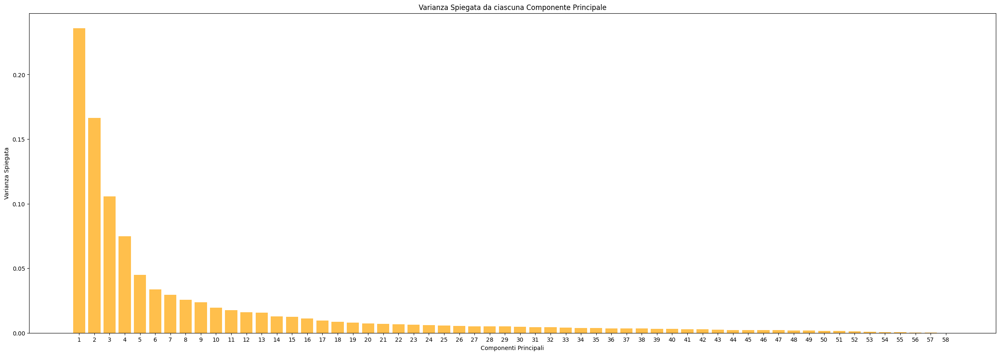

In [89]:
# Grafico della varianza spiegata da ciascuna componente principale
plt.figure(figsize=(30, 10))
plt.bar(range(1, len(explained_variances) + 1), explained_variances, alpha=0.7, color='orange')
plt.xlabel('Componenti Principali')
plt.ylabel('Varianza Spiegata')
plt.title('Varianza Spiegata da ciascuna Componente Principale')
plt.xticks(range(1, len(explained_variances) + 1))  # Aggiungi i numeri delle componenti sull'asse x
plt.show()